In [2]:
import cv2
import numpy as np
import skimage
from skimage import io,filters,feature
import matplotlib.pyplot as plt
import scipy as sp
import scipy.ndimage as nd
import math

Loading and presenting crazyBioComp with all 6 structural elements.

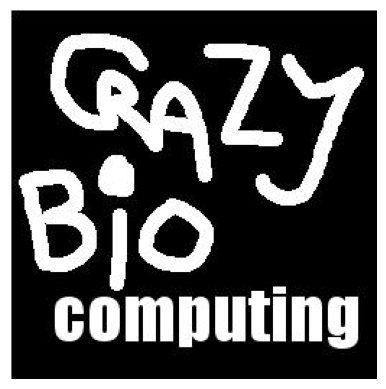

In [49]:
image = cv2.imread('crazyBioComp.jpg', cv2.IMREAD_GRAYSCALE)
square_selem = skimage.morphology.square(3)
disk_selem = skimage.morphology.disk(3)
erosion_image = skimage.morphology.erosion(image, disk_selem)
dilation_image = skimage.morphology.dilation(image, disk_selem)
close_image = skimage.morphology.binary_closing(image, disk_selem)
open_image = skimage.morphology.binary_opening(image, disk_selem)
tophat_image = image - open_image
bottomhat_image = close_image - image

plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

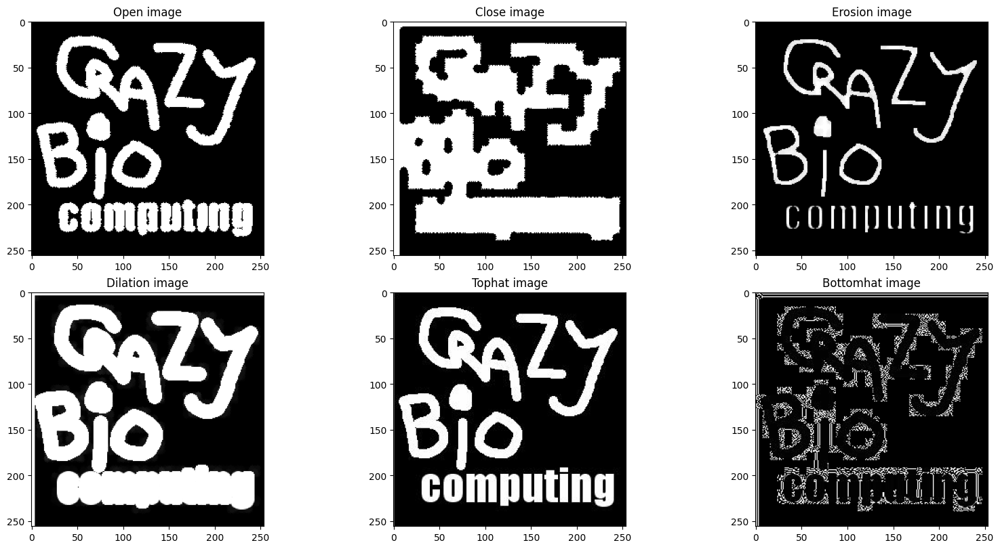

In [50]:
fig, axs = plt.subplots(2, 3, constrained_layout=True, figsize=(16, 8))


axs[0, 0].imshow(open_image, cmap="gray")
axs[0, 0].set_title("Open image")

axs[0, 1].imshow(close_image, cmap="gray")
axs[0, 1].set_title("Close image")

axs[0, 2].imshow(erosion_image, cmap="gray")
axs[0, 2].set_title("Erosion image")

axs[1, 0].imshow(dilation_image, cmap="gray")
axs[1, 0].set_title("Dilation image")

axs[1, 1].imshow(tophat_image, cmap="gray")
axs[1, 1].set_title("Tophat image")

axs[1, 2].imshow(bottomhat_image, cmap="gray")
axs[1, 2].set_title("Bottomhat image")

for ax in axs.flatten()[6:]:
    ax.axis('off')

plt.show()

Loading and presenting keboard image.

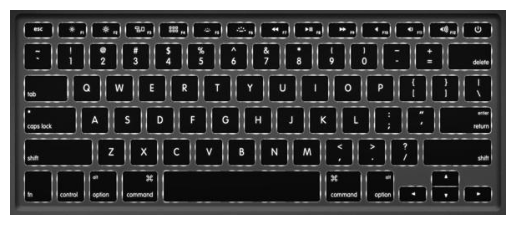

In [51]:
image = cv2.imread('keyboard.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

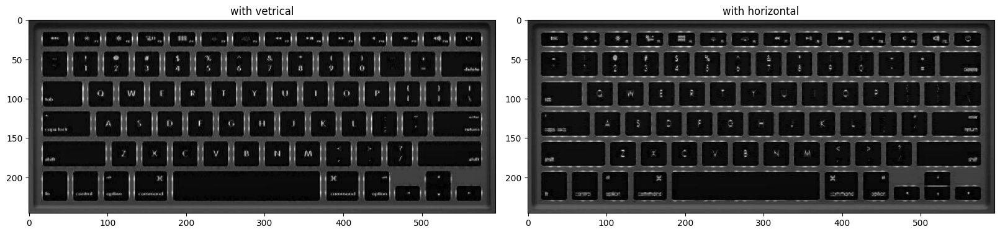

In [52]:
vertical_line_selem = np.array([[1],
                                [1],
                                [1]])
horizontal_line_selem = np.array([[1, 1, 1]])
square_selem = skimage.morphology.square(3)
fig, axs = plt.subplots(1, 2, constrained_layout=True, figsize=(16, 8))
vert = skimage.morphology.erosion(image, vertical_line_selem)
hori = skimage.morphology.erosion(image, horizontal_line_selem)
square = skimage.morphology.erosion(image, square_selem)

axs[0].imshow(vert, cmap="gray")
axs[0].set_title("with vetrical")

axs[1].imshow(hori, cmap="gray")
axs[1].set_title("with horizontal")

for ax in axs.flatten()[3:]:
    ax.axis('off')

plt.show()

Displaying the sum of the images from the previous section and after threshold with 0.2

the sum image is a bright image explaining the threshold with 0.2 provides a mostly white image.

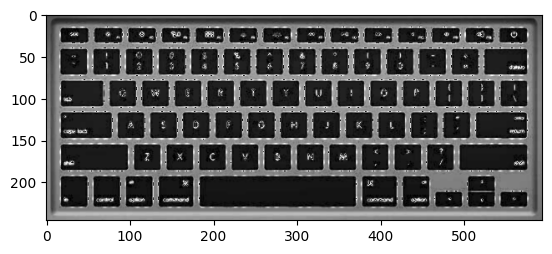

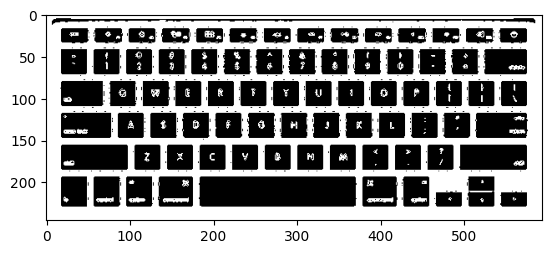

In [53]:
sum_image = vert + hori
plt.imshow(sum_image, cmap='gray')
plt.show()
threshold = 0.2 * 255
binary_image = sum_image > threshold
plt.imshow(binary_image, cmap='gray')
plt.show()

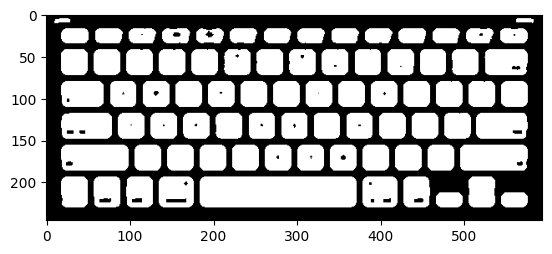

In [54]:
inverted_image = np.logical_not(binary_image)
square_eight = skimage.morphology.square(8)
filtered = filters.median(inverted_image, square_eight)
plt.imshow(filtered, cmap='gray')
plt.show()

We used median filter because for each pixel it takes the median pixel value which guaranteed to be binary whereas if we used mean filter for example, we would not necessarily get a binary value.

Erosion on filtered keyboard:

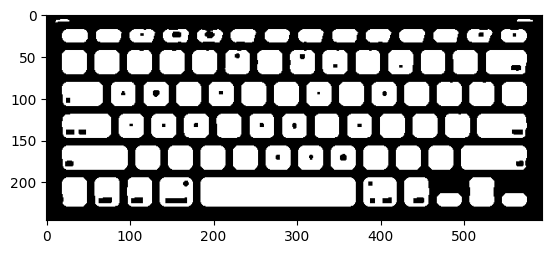

In [55]:
erosion_keyboard = skimage.morphology.erosion(filtered, square_selem)
plt.imshow(erosion_keyboard, cmap='gray')
plt.show()

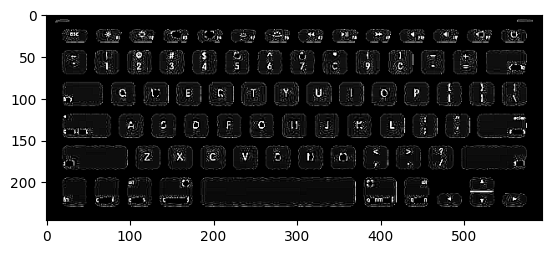

In [56]:
intersect_keyboard = image * erosion_keyboard
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
sharpen = cv2.filter2D(intersect_keyboard, -1, kernel)
plt.imshow(sharpen, cmap='gray')
plt.show()

the sharpened intersection after thresholding with a threshold of 250 turn almost everything black keeping only the keys white.

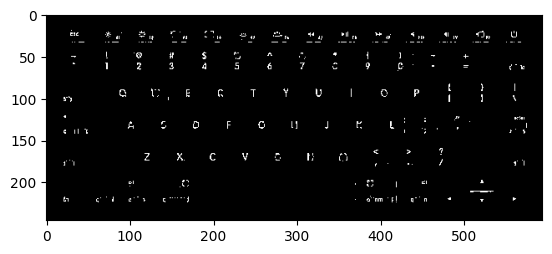

In [57]:
threshold = 250
thresholded = sharpen > threshold
plt.imshow(thresholded, cmap='gray')
plt.show()

In [58]:
def ssd(image, template):
    error = 0
    count = 0
    min_err = float('inf')
    M, N = template.shape
    for x in range(image.shape[0] - M + 1):
        for y in range(image.shape[1] - N + 1):
            window = image[x:x+M, y:y+N]
            error = np.sum((template - window) ** 2)
            if error < min_err:
                min_err = error
            if error < 1.5:
                count += 1
    return min_err ,count
def im2double(image):
    min_val = np.min(image.ravel())
    max_val = np.max(image.ravel())
    out = (image.astype('float') - min_val) / (max_val - min_val)
    return out

0.7158051689521125 E14


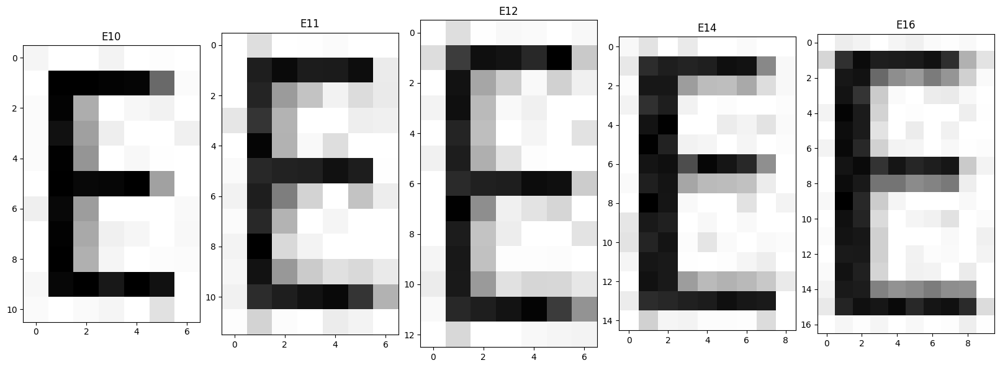

In [59]:
text_image = cv2.imread("Text.jpg", cv2.IMREAD_GRAYSCALE)
E10 = cv2.imread("E10.jpg", cv2.IMREAD_GRAYSCALE)
E11 = cv2.imread("E11.jpg", cv2.IMREAD_GRAYSCALE)
E12 = cv2.imread("E12.jpg", cv2.IMREAD_GRAYSCALE)
E14 = cv2.imread("E14.jpg", cv2.IMREAD_GRAYSCALE)
E16 = cv2.imread("E16.jpg", cv2.IMREAD_GRAYSCALE)
text_image = im2double(text_image)
E10 = im2double(E10)
E11 = im2double(E11)
E12 = im2double(E12)
E14 = im2double(E14)
E16 = im2double(E16)
fig, axs = plt.subplots(1, 5, constrained_layout=True, figsize=(16, 8))
axs[0].imshow(E10, cmap="gray")
axs[0].set_title("E10")
axs[1].imshow(E11, cmap="gray")
axs[1].set_title("E11")
axs[2].imshow(E12, cmap="gray")
axs[2].set_title("E12")
axs[3].imshow(E14, cmap="gray")
axs[3].set_title("E14")
axs[4].imshow(E16, cmap="gray")
axs[4].set_title("E16")
best_error = float('inf')
best_template = 0
templates = [E10, E11, E12, E14, E16]
templates_names = ["E10", "E11", "E12", "E14", "E16"]
for template, template_name in zip(templates, templates_names):
    error ,count = ssd(text_image, template)
    if error < best_error:
        best_error = error
        best_template = template_name
print(best_error, best_template)


the conclusion is that the size of the text is 14 since E14 had the smallest error.

there are 29 t's in the text.
there are 32 a's in the text.


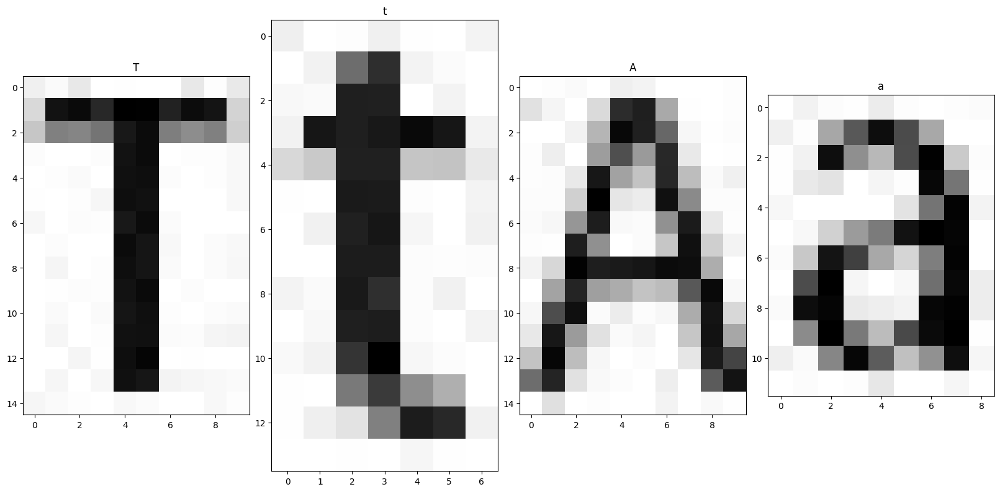

In [60]:
T = cv2.imread("T_big.jpg", cv2.IMREAD_GRAYSCALE)
t = cv2.imread("t_small.jpg", cv2.IMREAD_GRAYSCALE)
A = cv2.imread("A_big.jpg", cv2.IMREAD_GRAYSCALE)
a = cv2.imread("a_small.jpg", cv2.IMREAD_GRAYSCALE)
T = im2double(T)
t = im2double(t)
A = im2double(A)
a = im2double(a)
counter = 0
templates = [T, t]
for template in templates:
    error ,count = ssd(text_image, template)
    counter += count
num_t = "there are {} t's in the text."
print(num_t.format(counter))
counter = 0
templates = [A, a]
for template in templates:
    error ,count = ssd(text_image, template)
    counter += count
num_a = "there are {} a's in the text."
print(num_a.format(counter))
fig, axs = plt.subplots(1, 4, constrained_layout=True, figsize=(16, 8))
axs[0].imshow(T, cmap="gray")
axs[0].set_title("T")
axs[1].imshow(t, cmap="gray")
axs[1].set_title("t")
axs[2].imshow(A, cmap="gray")
axs[2].set_title("A")
axs[3].imshow(a, cmap="gray")
axs[3].set_title("a")
plt.show()

the chosen threshold is 1.5 and it managed to identify all the times an a or a t appeared (i counted).

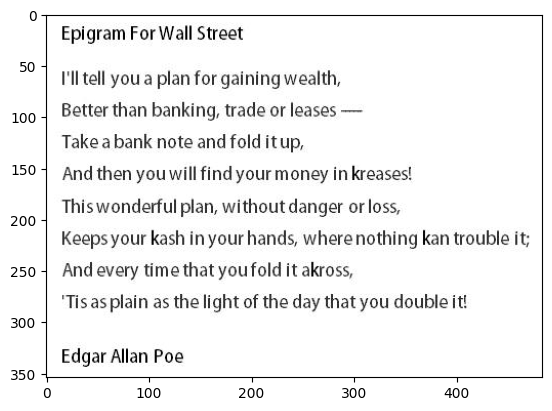

In [61]:
text_image = cv2.imread("Text.jpg", cv2.IMREAD_GRAYSCALE)
c = cv2.imread("c.jpg", cv2.IMREAD_GRAYSCALE)
k = cv2.imread("k.jpg", cv2.IMREAD_GRAYSCALE)
M, N = c.shape
text_image = im2double(text_image)
c = im2double(c)
k = im2double(k)
for x in range(text_image.shape[0] - M + 1):
    for y in range(text_image.shape[1] - N + 1):
        window = text_image[x:x+M, y:y+N]
        error = np.sum((c - window) ** 2)
        if error < 1.5:
            text_image[x:x+M, y:y+N] = k
plt.imshow(text_image, cmap='gray')
plt.show()

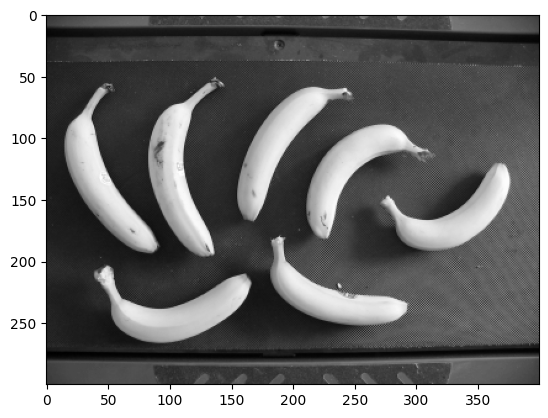

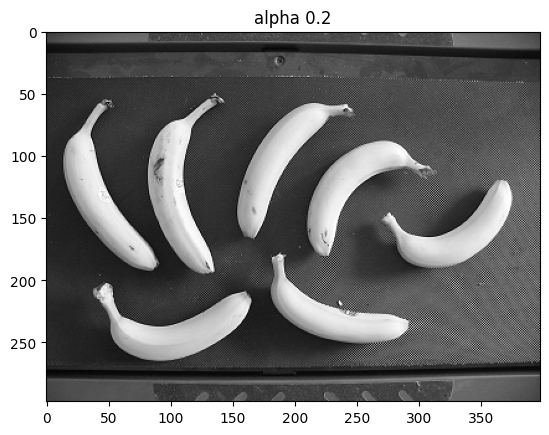

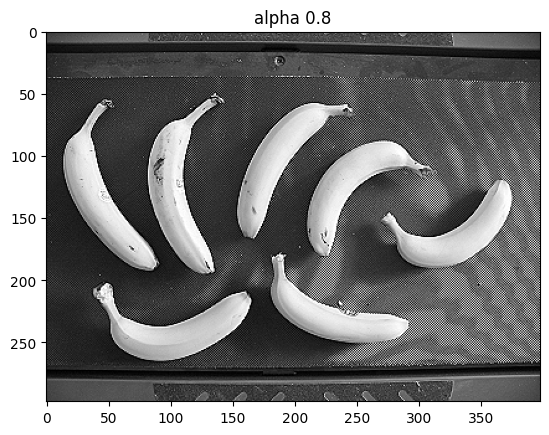

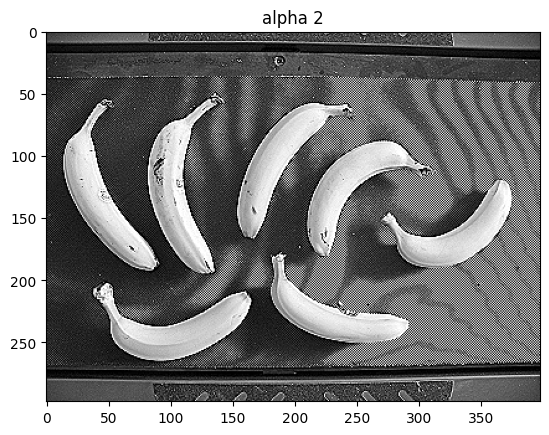

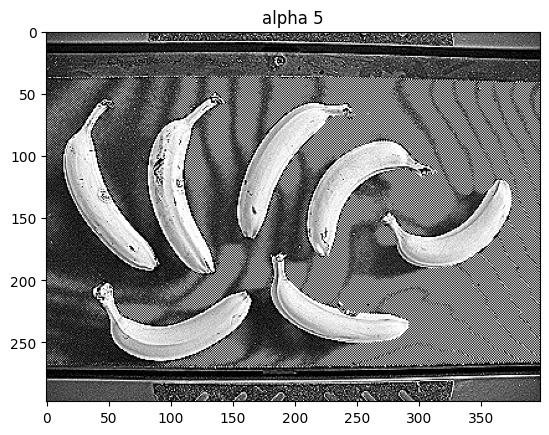

In [62]:
bananas = cv2.imread("Bananas.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(bananas, cmap='gray')
plt.show()
alphas = [0.2, 0.8, 2, 5]
alpha_dict = {0.2: 'alpha 0.2', 0.8: 'alpha 0.8', 2: 'alpha 2', 5: 'alpha 5'}
for alpha in alphas:
    lap = np.array([[0, -alpha, 0],
                   [-alpha, 1 + 4*alpha, -alpha],
                   [0 , -alpha, 0]])
    result = sp.signal.convolve2d(bananas, lap, mode='valid')
    result = np.clip(result, 0, 255)
    plt.imshow(result, cmap='gray')
    plt.title(alpha_dict[alpha])
    plt.show()
    

optimal reuslt in my opinion is 0.2 because it sharpens the image well and doesn't distort it too much as can be seen in 5 for example.
the filter performs edge sharpening since it is a second derivative filter identifying changes in greyscale. the purpose of alpha is to determine how much do we want to make the image sharper.

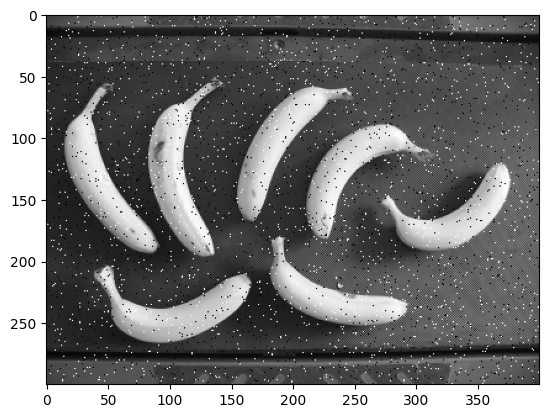

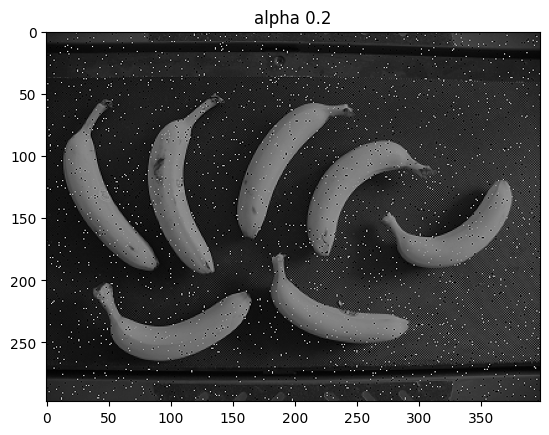

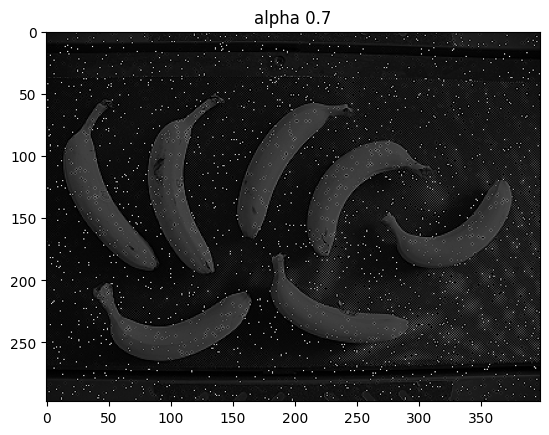

In [63]:
noisy_bananas = skimage.util.random_noise(bananas, mode='s&p', amount=0.03)
plt.imshow(noisy_bananas, cmap='gray')
plt.show()
lap02 = np.array([[0, -0.2, 0],
                   [-0.2, 1 + 0.8, -0.2],
                   [0 , -0.2, 0]])
result = sp.signal.convolve2d(noisy_bananas, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
lap07 = np.array([[0, -0.7, 0],
                   [-0.7, 1 + 2.8, -0.7],
                   [0 , -0.7, 0]])
result = sp.signal.convolve2d(noisy_bananas, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()
    

the noise was amplified because the laplacian filter is a high pass filter and the noisy areas have high frequency and the laplacian filter emphasizes them.

a way to improve results is to use median filter before the convolution in order to reduce noise. the results will improve since like we did before in this exercise. a median filter can be used to reduce noise and therefore the laplacian encounters less noise and amplifies it less.

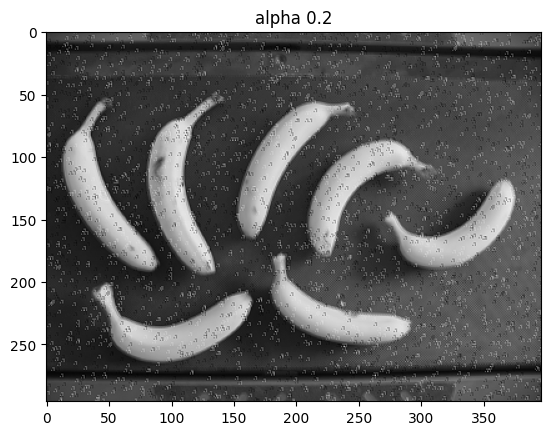

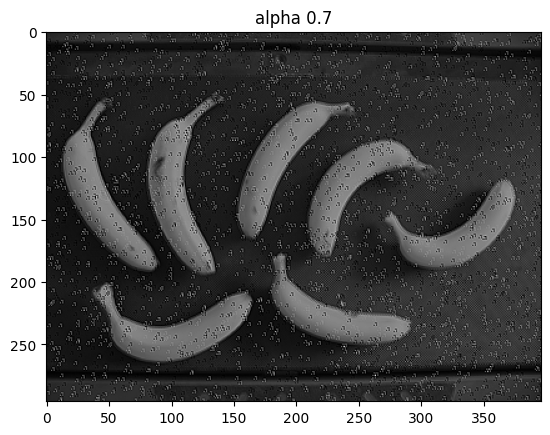

In [64]:
median = np.array([[0,9,9],
                   [1,0,9],
                   [9,1,9]])
noisy_bananas_median = sp.signal.convolve2d(noisy_bananas, median, mode='valid')
result = sp.signal.convolve2d(noisy_bananas_median, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
result = sp.signal.convolve2d(noisy_bananas_median, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()

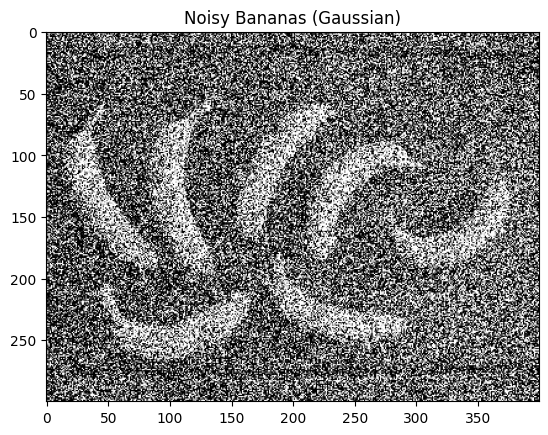

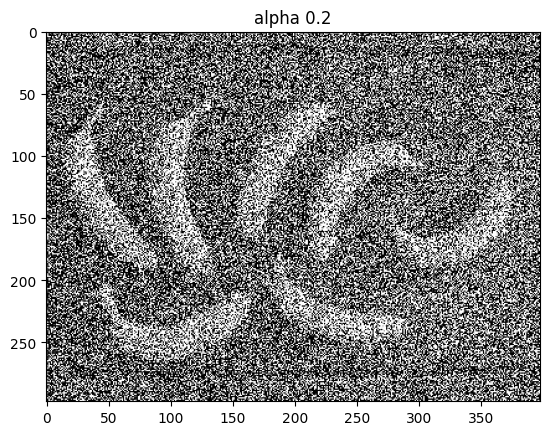

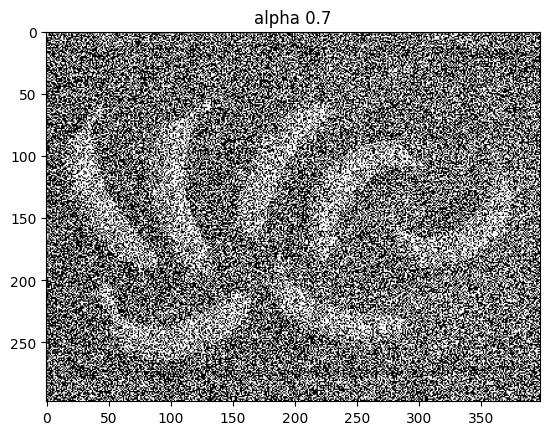

In [65]:
noise = np.random.normal(0, 0.003 * 255 ** 2, bananas.shape)
noisy_bananas = bananas + noise
noisy_bananas = np.clip(noisy_bananas, 0, 255)
noisy_bananas = noisy_bananas.astype(np.uint8)
plt.imshow(noisy_bananas, cmap='gray')
plt.title("Noisy Bananas (Gaussian)")
plt.show()
result = sp.signal.convolve2d(noisy_bananas, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
result = sp.signal.convolve2d(noisy_bananas, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()

just like with snp, laplacian is a high pass filter amplifying the noise.

a way to improve the image is to use a low pass filter before applying laplacian. we'll apply mean filter on the images.

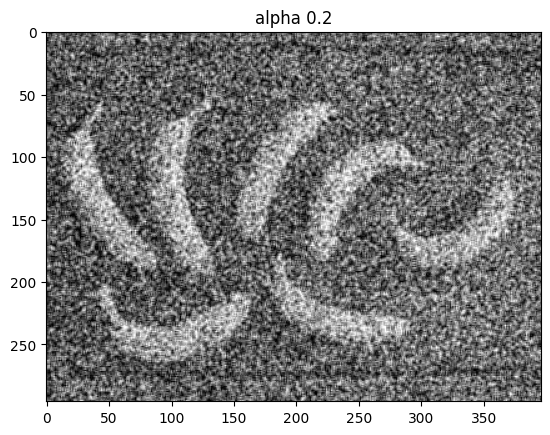

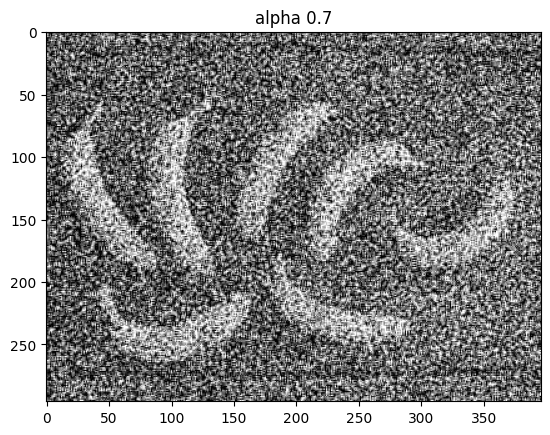

In [66]:
mean = np.array([[1/9,1/9,1/9],
                 [1/9,1/9,1/9],
                 [1/9,1/9,1/9]])
noisy_bananas_mean = sp.signal.convolve2d(noisy_bananas, mean, mode='valid')
result = sp.signal.convolve2d(noisy_bananas_mean, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
result = sp.signal.convolve2d(noisy_bananas_mean, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()

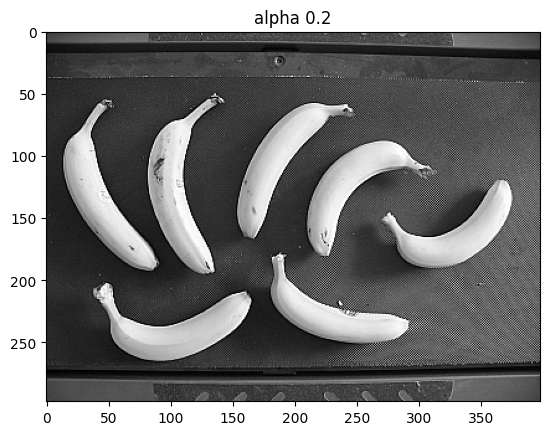

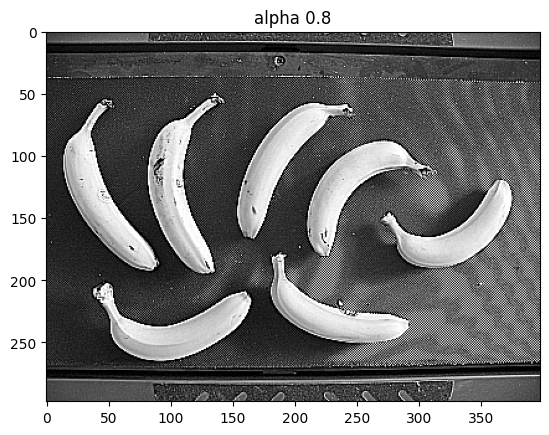

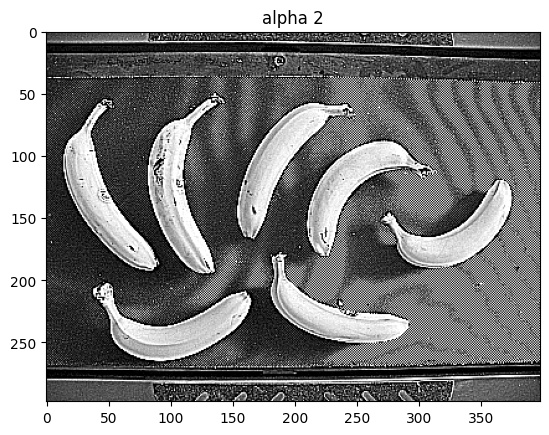

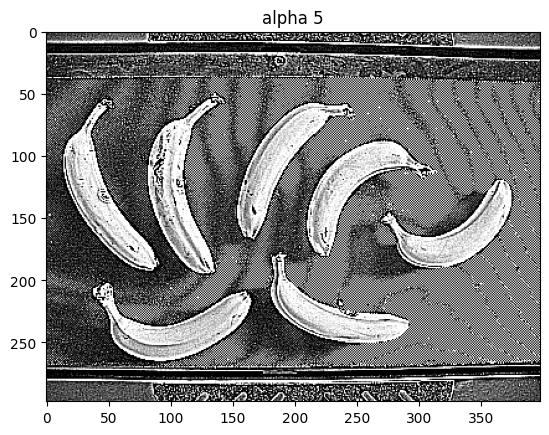

In [67]:
for alpha in alphas:
    lap = np.array([[-alpha, -alpha, -alpha],
                   [-alpha, 1 + 8*alpha, -alpha],
                   [-alpha , -alpha, -alpha]])
    result = sp.signal.convolve2d(bananas, lap, mode='valid')
    result = np.clip(result, 0, 255)
    plt.imshow(result, cmap='gray')
    plt.title(alpha_dict[alpha])
    plt.show()

the edges appear to be sharper using this filter.

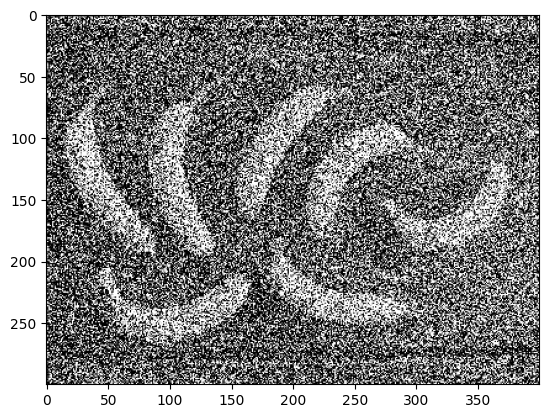

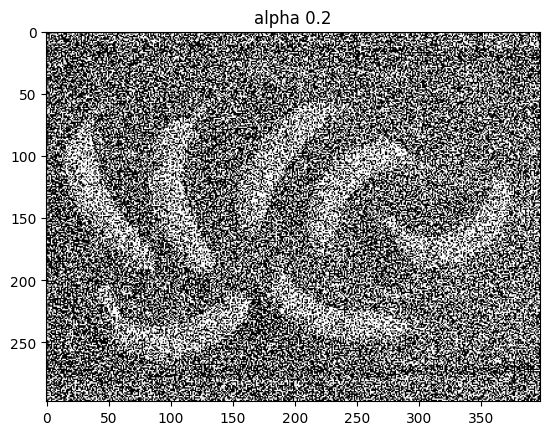

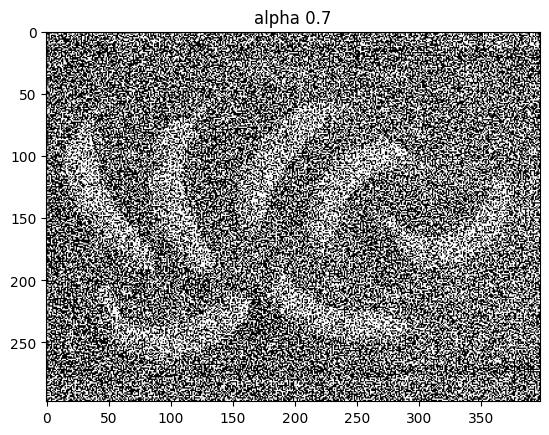

In [68]:
noise = np.random.normal(0, 0.003 * 255 ** 2, bananas.shape)
noisy_bananas = bananas + noise
noisy_bananas = np.clip(noisy_bananas, 0, 255)
noisy_bananas = noisy_bananas.astype(np.uint8)
plt.imshow(noisy_bananas, cmap='gray')
plt.show()
lap02 = np.array([[-0.2, -0.2, -0.2],
                   [-0.2, 1 + 1.6, -0.2],
                   [-0.2 , -0.2, -0.2]])
result = sp.signal.convolve2d(noisy_bananas, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
lap07 = np.array([[-0.7, -0.7, -0.7],
                   [-0.7, 1 + 5.6, -0.7],
                   [-0.7 , -0.7, -0.7]])
result = sp.signal.convolve2d(noisy_bananas, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()

we'll fix it the same way as the kernel before using mean filter before the laplacian.

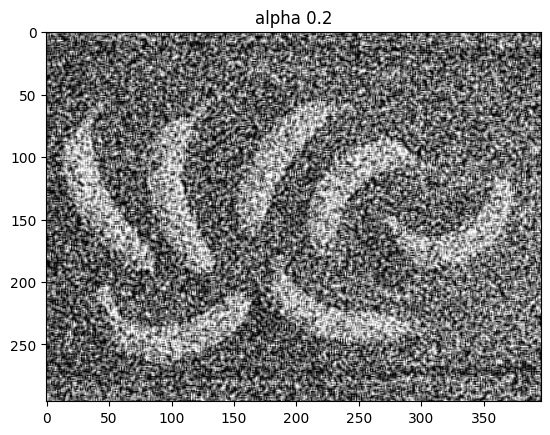

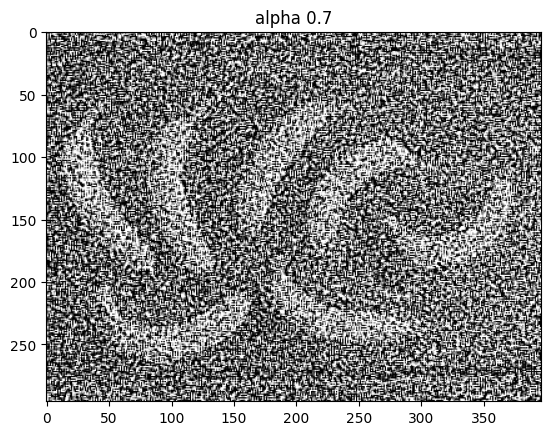

In [69]:
noisy_bananas_mean = sp.signal.convolve2d(noisy_bananas, mean, mode='valid')
result = sp.signal.convolve2d(noisy_bananas_mean, lap02, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.2")
plt.show()
result = sp.signal.convolve2d(noisy_bananas_mean, lap07, mode='valid')
result = np.clip(result, 0, 255)
plt.imshow(result, cmap='gray')
plt.title("alpha 0.7")
plt.show()

In [70]:
def pyramids(image, layers):
    gaussian_pyramid = [image]

    for _ in range(layers):
        image = cv2.pyrDown(image)
        gaussian_pyramid.append(image)
    laplacian_pyramid = []
    for i in range(layers - 1):
        expanded = cv2.pyrUp(gaussian_pyramid[i+1])
        if expanded.shape[0] != gaussian_pyramid[i].shape[0] or expanded.shape[1] != gaussian_pyramid[i].shape[1]:
            expanded = cv2.resize(expanded, (gaussian_pyramid[i].shape[1], gaussian_pyramid[i].shape[0]))
        laplacian = cv2.subtract(gaussian_pyramid[i], expanded)
        laplacian_pyramid.append(laplacian)
    expanded = cv2.pyrUp(gaussian_pyramid[layers])
    laplacian = cv2.subtract(gaussian_pyramid[layers - 1], expanded)
    laplacian_pyramid.append(laplacian)
    return gaussian_pyramid, laplacian_pyramid





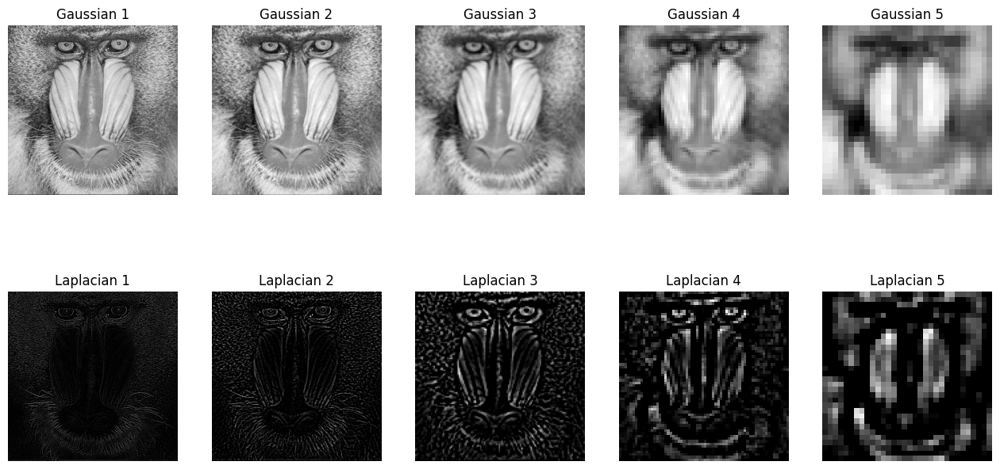

In [71]:
mandrill = cv2.imread("Mandrill.jpg", cv2.IMREAD_GRAYSCALE)
mandrill_gaus, mandrill_lap = pyramids(mandrill, 5)
fig, axs = plt.subplots(2, 5, figsize=(16, 8))
for i in range(5):
    axs[0, i].imshow(mandrill_gaus[i], cmap="gray")
    axs[0, i].set_title(f"Gaussian {i+1}")
    axs[0, i].axis("off")
    axs[1, i].imshow(mandrill_lap[i], cmap="gray")
    axs[1, i].set_title(f"Laplacian {i+1}")
    axs[1, i].axis("off")
plt.show()

In [72]:
def restore_image(lap_pyramid, layers):
    restored_image = lap_pyramid[layers - 1] 

    for i in range(layers - 2, -1, -1):
        expanded = cv2.pyrUp(restored_image)
        expanded = cv2.resize(expanded, (lap_pyramid[i].shape[1], lap_pyramid[i].shape[0]))
        restored_image = cv2.add(expanded, lap_pyramid[i])
    return restored_image

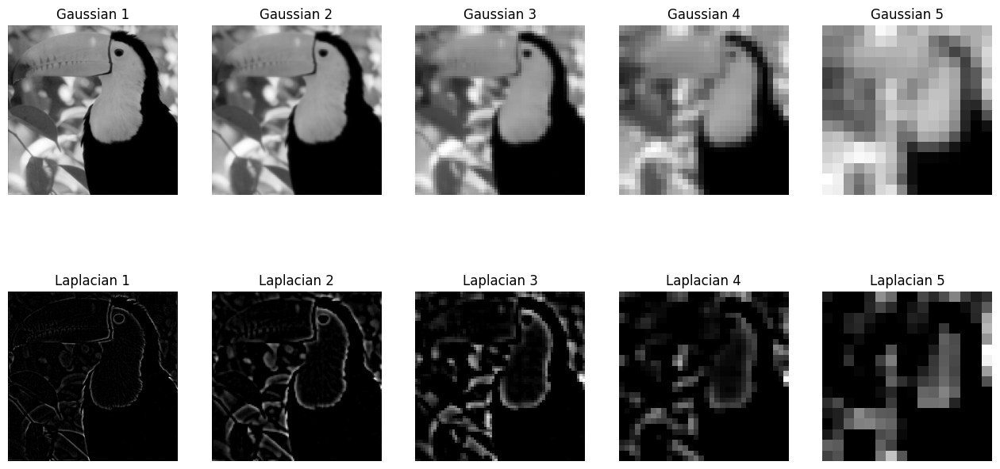

In [73]:
toucan = cv2.imread("toucan.tif", cv2.IMREAD_GRAYSCALE)
toucan_gaus, toucan_lap = pyramids(toucan, 5)
fig, axs = plt.subplots(2, 5, figsize=(16, 8))
for i in range(5):
    axs[0, i].imshow(toucan_gaus[i], cmap="gray")
    axs[0, i].set_title(f"Gaussian {i+1}")
    axs[0, i].axis("off")
    axs[1, i].imshow(toucan_lap[i], cmap="gray")
    axs[1, i].set_title(f"Laplacian {i+1}")
    axs[1, i].axis("off")
plt.show()

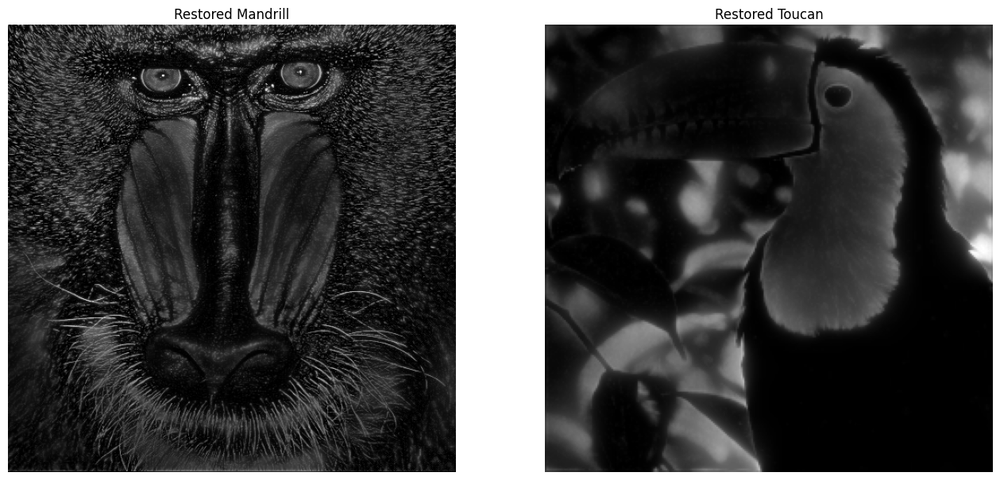

In [74]:
mandrill_restore = restore_image(mandrill_lap, 5)
toucan_restore = restore_image(toucan_lap, 5)
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs[0].imshow(mandrill_restore.astype('uint8'), cmap='gray')
axs[1].imshow(toucan_restore.astype('uint8'), cmap='gray')
axs[0].set_title("Restored Mandrill")
axs[1].set_title("Restored Toucan")
axs[0].axis("off")
axs[1].axis("off")
plt.show()

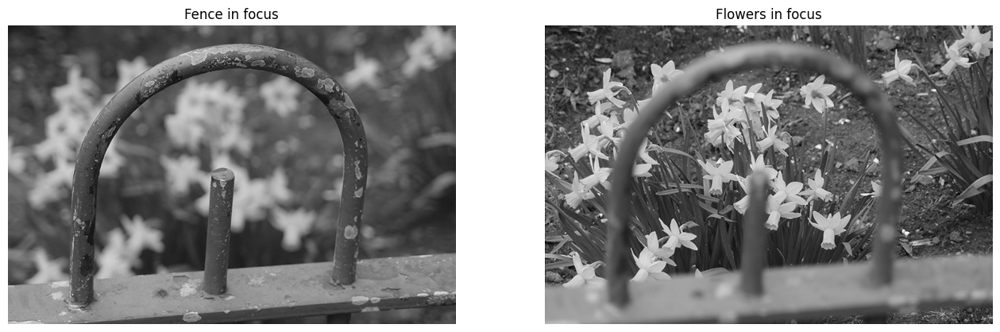

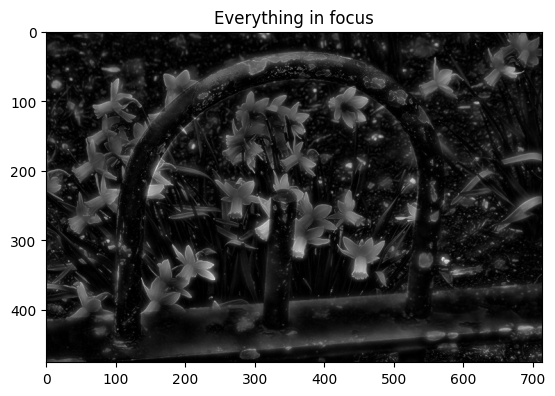

In [75]:
focus1 = cv2.imread("focus1.tif", cv2.IMREAD_GRAYSCALE)
focus2 = cv2.imread("focus2.tif", cv2.IMREAD_GRAYSCALE)
_, lap_focus1 = pyramids(focus1, 4)
_, lap_focus2 = pyramids(focus2, 4)
combined_focus = []
for i in range (4):
    combined_focus.append(cv2.add(lap_focus1[i],lap_focus2[i]))
restored_with_focus = restore_image(combined_focus, 4)
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs[0].imshow(focus1.astype('uint8'), cmap='gray')
axs[1].imshow(focus2.astype('uint8'), cmap='gray')
axs[0].set_title("Fence in focus")
axs[1].set_title("Flowers in focus")
axs[0].axis("off")
axs[1].axis("off")
plt.show()
plt.imshow(restored_with_focus, cmap='gray')
plt.title("Everything in focus")
plt.show()


In [4]:
def dct_transform(pic, k):
    N = pic.shape[0]
    M = N // k
    dct_image = np.zeros_like(pic)

    for i in range(M):
        for j in range(k):
            block = pic[i*k:(i+1)*k, j*M:(j+1)*M]
            dct_block = sp.fftpack.dct(sp.fftpack.dct(block, axis=0, norm='ortho'), axis=1, norm='ortho')
            dct_image[i*k:(i+1)*k, j*M:(j+1)*M] = dct_block


    return dct_image

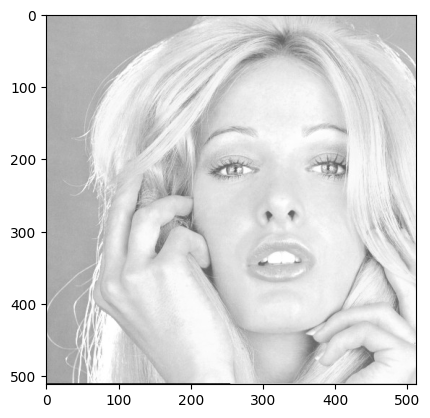

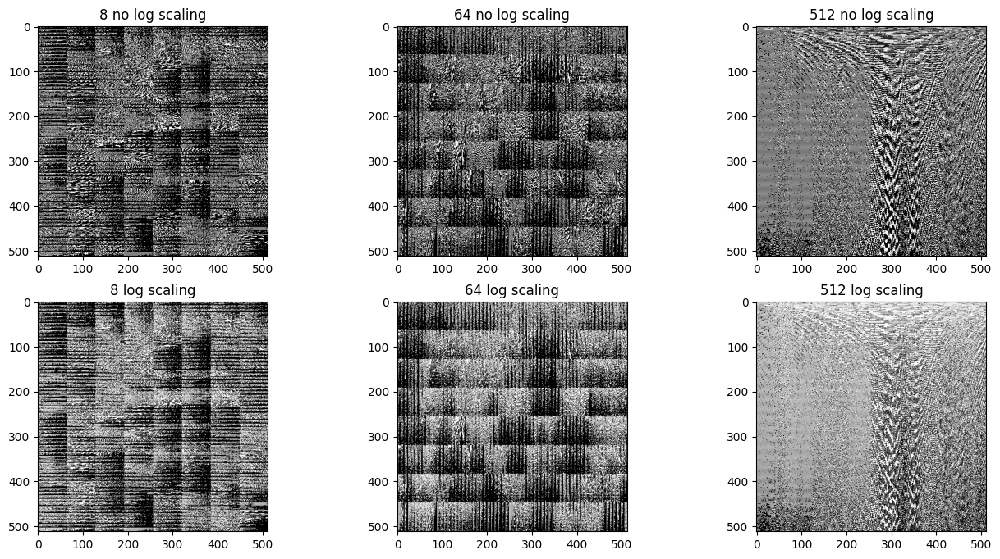

In [5]:
tiffany = cv2.imread("Tiffany.jpg", cv2.IMREAD_GRAYSCALE)
plt.imshow(tiffany, cmap='gray')
k_vals = [8, 64, 512]
ones = np.ones(512)
fig, axs = plt.subplots(2, 3, figsize=(16, 8))
for i in range(3):
    axs[0, i].imshow(dct_transform(tiffany, k_vals[i]), cmap="gray")
    axs[0, i].set_title(f"{k_vals[i]} no log scaling")
    axs[1, i].imshow(np.log(ones + dct_transform(tiffany, k_vals[i])), cmap="gray")
    axs[1, i].set_title(f"{k_vals[i]} log scaling")
plt.show()


the difference between the different k values is because we look at different block sizes. for example when k is 8 we look at a bigger environment than when k is 512. different block sizes can help isolate parts of the image we want to look at separately.

In [6]:
def dct_L_coeff(pic, k, l):
    N = pic.shape[0]
    M = N // k
    dct_image = np.zeros_like(pic)

    for i in range(M):
        for j in range(k):
            block = pic[i*k:(i+1)*k, j*M:(j+1)*M]
            dct_block = sp.fftpack.dctn(block, type=2, norm='ortho')

            threshold = np.percentile(np.abs(dct_block), l * 100)
            dct_block[np.abs(dct_block) < threshold] = 0

            dct_image[i*k:(i+1)*k, j*M:(j+1)*M] = dct_block

    return dct_image

In [7]:
def idct_coeff(c, k):
    N = c.shape[0]
    M = N // k
    idct_image = np.zeros_like(c)
    for i in range(M):
        for j in range(k):
            idct_block = sp.fftpack.idctn(c[i*k:(i+1)*k, j*M:(j+1)*M], type=2, norm='ortho')
            idct_image[i*k:(i+1)*k, j*M:(j+1)*M] = idct_block

    return idct_image

In [8]:
def quantize(dct_coeffs, qf):
    scale = 1.0 / qf
    quantized_coeffs = np.round(dct_coeffs * scale)
    return quantized_coeffs

def dequantize(quantized_coeffs, qf):
    scale = 1.0 / qf
    dequantized_coeffs = quantized_coeffs / scale
    return dequantized_coeffs

In [9]:
def dct_L_and_back(pic, k, l):
    qf = 50
    trans = dct_L_coeff(pic, k, l)
    quantized_trans = quantize(trans, qf)
    dequantized_trans = dequantize(quantized_trans, qf)
    back = idct_coeff(dequantized_trans, k)
    return dequantized_trans, back

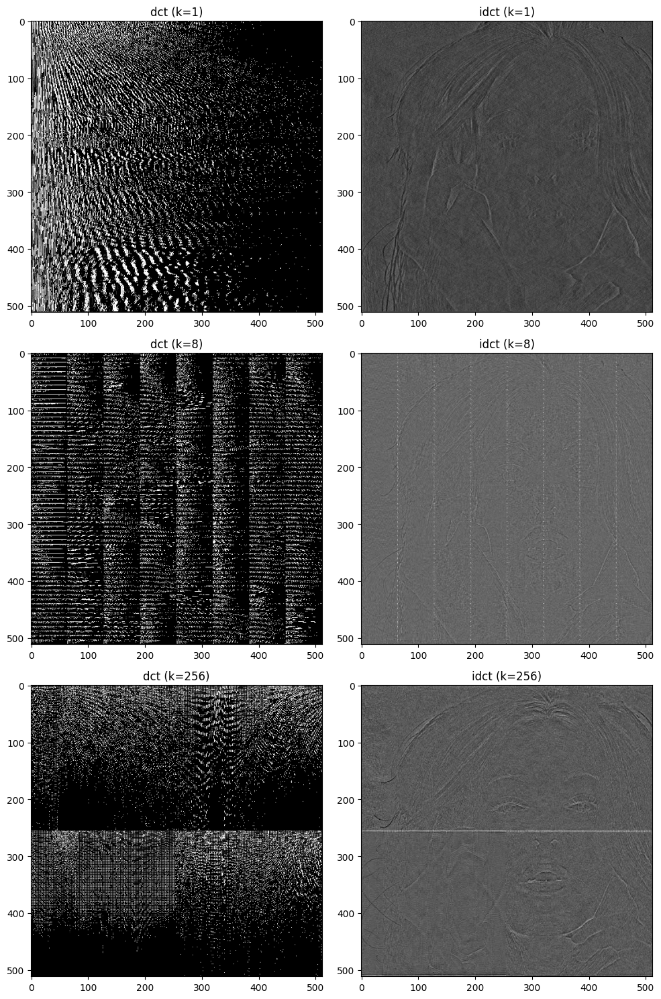

In [14]:
k_vals = [1, 8, 64]

fig, axs = plt.subplots(3, 2, figsize=(10, 15))
results = []
for i, k in enumerate(k_vals):
    dequantized_trans, back = dct_L_and_back(tiffany, k, 0.75)

    axs[i, 0].imshow(dequantized_trans, cmap='gray')
    axs[i, 0].set_title(f"dct (k={k})")

    axs[i, 1].imshow(back, cmap='gray')
    axs[i, 1].set_title(f"idct (k={k})")
    results.append(back)
plt.tight_layout()
plt.show()

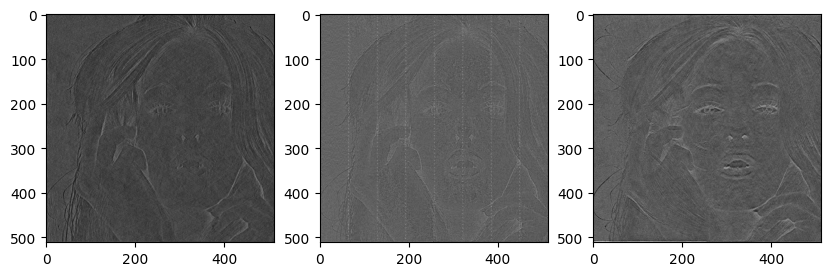

In [11]:
diff = []
for i in range(3):
    diff.append(results[i] - tiffany)
fig, axs = plt.subplots(1, 3, figsize=(10, 15))
axs[0].imshow(diff[0],cmap='gray')
axs[1].imshow(diff[1],cmap='gray')
axs[2].imshow(diff[2],cmap='gray')
plt.show()
    

In [13]:
vals = [1,2,4,8,16,64,128,256]
results = {}
for k in vals:
    _, back = dct_L_and_back(tiffany, k, 0.75)
    mse = (np.sum(tiffany - back) ** 2)
    results[k] = mse
min_key = min(results, key=lambda x: results[x])
min_val = results[min_key]

print("min mse:")
print("key:", min_key)
print("value:", min_val)

min mse:
key: 256
value: 2889207223407200.5


the conclusion is that k = 256 gives the best result because it has the lowest error